In [12]:
%reload_kedro --env arch

[03/02/24 16:37:11] INFO     Resolved project path as:                                              ]8;id=81245;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=820629;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#146\146]8;;\
                             /home/jamontanac/Documents/AdversarialExamples/adversarialexamples.                   
                             To set a different path, run '%reload_kedro <project_root>'                           

[03/02/24 16:37:13] INFO     Kedro project AdversarialExamples                                      ]8;id=328477;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=548367;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#115\115]8;;\

                    INFO     Defined global variable 'context', 'session', 'catalog' and            ]8;id=176012;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=47705;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#116\116]8;;\
                             'pipelines'                                                                           

                    INFO     Registered line magic 'run_viz'                                        ]8;id=738475;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=551108;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#122\122]8;;\

In [13]:
catalog.list("model")


[
    'Regnet_x_model',
    'Regnet_y_model',
    'Resnet_model',
    'Regnet_x_model_Adversarial_CarliniL2@Dataset',
    'Regnet_x_model_Adversarial_DeepFool@Dataset',
    'Regnet_x_model_Adversarial_FSGM@Dataset',
    'Regnet_x_model_Adversarial_PGD@Dataset',
    'Regnet_y_model_Adversarial_CarliniL2@Dataset',
    'Regnet_y_model_Adversarial_DeepFool@Dataset',
    'Regnet_y_model_Adversarial_FSGM@Dataset',
    'Regnet_y_model_Adversarial_PGD@Dataset',
    'Resnet_model_Adversarial_CarliniL2@Dataset',
    'Resnet_model_Adversarial_DeepFool@Dataset',
    'Resnet_model_Adversarial_FSGM@Dataset',
    'Resnet_model_Adversarial_PGD@Dataset',
    'params:training_parameters_Resnet.model_name',
    'params:training_parameters_RegnetX.model_name',
    'params:training_parameters_RegnetY.model_name'
]

In [14]:
model = catalog.load("Resnet_model")
attacks = ["DeepFool","CarliniL2","PGD","FSGM"]
# classes = ["airplane","automobile","bird","cat","deer","dog","frog","horse","ship","truck"]

                    INFO     Loading data from Resnet_model (PytorchDatasetModel)...            ]8;id=309860;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=786477;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\

In [15]:
adver = catalog.load(f'Resnet_model_Adversarial_{attacks[-1]}@Dataset')

[03/02/24 16:37:14] INFO     Loading data from Resnet_model_Adversarial_FSGM@Dataset            ]8;id=160956;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=733616;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

In [16]:
import torch.nn.functional as F
import matplotlib.pyplot as plt

In [17]:
import torch
from torchvision.transforms import transforms
def flip_image(image, axis=2):
    """
    Flips an image over a specific axis, default around y axis.

    Args:
        image (torch.Tensor): The input image to flip.

    Returns:
        torch.Tensor: The flipped image.
    """
    return image.flip(axis)

def resize_pad(image, ratio=1):
    """
    Resizes and pads an image with zeros to match the original size.

    Args:
        image (torch.Tensor): The input image to resize and pad.
        ratio (float): The ratio to resize the image by (default 0.8).

    Returns:
        torch.Tensor: The resized and padded image.
    """
    transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(int(image.shape[1] * ratio)),
        transforms.ToTensor()
    ])
    resized_image = transform(image)
    max_dim = image.shape[1] - resized_image.shape[1]
    start_y = torch.randint(0, max_dim + 1, (1,))
    start_x = torch.randint(0, max_dim + 1, (1,))
    padded_image = torch.zeros_like(image)
    padded_image[:,start_y:start_y + resized_image.shape[1], start_x:start_x + resized_image.shape[1]] = resized_image

    return padded_image
image = adver['examples'][0]
result=resize_pad(image, 1)
original_image = adver['examples'][0]
result = flip_image(result ,3)
#plot adversarial transformed image and original image
ax, fig = plt.subplots(1, 2, figsize=(10, 5))
fig[0].imshow(original_image.permute(1, 2, 0))
fig[0].set_title("Original Image")
fig[1].imshow(result.permute(1, 2, 0))
fig[1].set_title("Adversarial Image")
plt.show()
# plt.imshow(result.permute(1, 2, 0))
# plt.show()
# result = flip_image(result )
# plt.imshow(result.permute(1, 2, 0))
# plt.show()

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:42                                                                                   │
│                                                                                                  │
│   39 image = adver['examples'][0]                                                                │
│   40 result=resize_pad(image, 1)                                                                 │
│   41 original_image = adver['examples'][0]                                                       │
│ ❱ 42 result = flip_image(result ,3)                                                              │
│   43 #plot adversarial transformed image and original image                                      │
│   44 ax, fig = plt.subplots(1, 2, figsize=(10, 5))                                               │
│   45 fig[0].imshow(original_image.permute(1, 2, 0))                                              │
│                                                                                                  │
│ in flip_image:13                                                                                 │
│                                                                                                  │
│   10 │   Returns:                                                                                │
│   11 │   │   torch.Tensor: The flipped image.                                                    │
│   12 │   """                                                                                     │
│ ❱ 13 │   return image.flip(axis)                                                                 │
│   14                                                                                             │
│   15 def resize_pad(image, ratio=1):                                                             │
│   16 │   """                                                                                     │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯
IndexError: Dimension out of range (expected to be in range of [-3, 2], but got 3)

[03/02/24 16:38:03] WARNING  Clipping input data to the valid range for imshow with RGB data ([0..1]   ]8;id=98419;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py\image.py]8;;\:]8;id=742786;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py#701\701]8;;\
                             for floats or [0..255] for integers).                                                 

                    WARNING  Clipping input data to the valid range for imshow with RGB data ([0..1]   ]8;id=708666;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py\image.py]8;;\:]8;id=542013;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py#701\701]8;;\
                             for floats or [0..255] for integers).                                                 

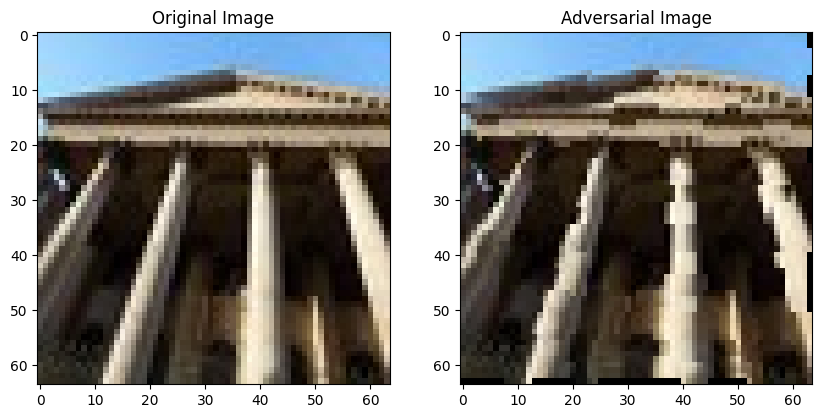

In [20]:

def random_distortion(h, w, d, delta):
    """
    Returns distorted coordinates
    """
    nw = w // d
    nh = h // d
    distorted_coords = torch.zeros(nh+1, nw+1, 2)
    
    for m in range(nw+1):
        for n in range(nh+1):
            dx = (torch.rand(1) * 2 - 1) * delta  
            dy = (torch.rand(1) * 2 - 1) * delta 
            x = m * d + dx
            y = n * d + dy
            distorted_coords[n, m, 0] = x
            distorted_coords[n, m, 1] = y
            
    return distorted_coords

def image_distortion(img, d=4, delta=0.5):
    """
    Apply distortion to a given image.
    img: a tensor of shape (C, H, W)
    d: size of the grid
    delta: distortion limit
    """
    C, H, W = img.shape
    nw = W // d
    nh = H // d
    distorted_coords = random_distortion(H, W, d, delta)
    distorted_image = torch.zeros_like(img)
    
    for m in range(nw+1):
        for n in range(nh+1):
            src_x = m * d
            src_y = n * d
            dest_x = int(distorted_coords[n, m, 0].item())
            dest_y = int(distorted_coords[n, m, 1].item())
            for i in range(d+1):
                for j in range(d+1):
                    if src_y + j < H and src_x + i < W and dest_y + j < H and dest_x + i < W:
                        distorted_image[:, dest_y + j, dest_x + i] = img[:, src_y + j, src_x + i]
                        
    return distorted_image

image = adver['examples'][3]
original_image = adver['examples'][3]
result=image_distortion(image, 4, 0.5)
ax, fig = plt.subplots(1, 2, figsize=(10, 5))
fig[0].imshow(original_image.permute(1, 2, 0))
fig[0].set_title("Original Image")
fig[1].imshow(result.permute(1, 2, 0))
fig[1].set_title("Adversarial Image")
plt.show()
# result=image_distortion(image, 4, 0.5)
# plt.imshow(result.permute(1, 2, 0))
# plt.show()


[03/02/24 16:39:01] WARNING  Clipping input data to the valid range for imshow with RGB data ([0..1]   ]8;id=609268;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py\image.py]8;;\:]8;id=701849;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py#701\701]8;;\
                             for floats or [0..255] for integers).                                                 

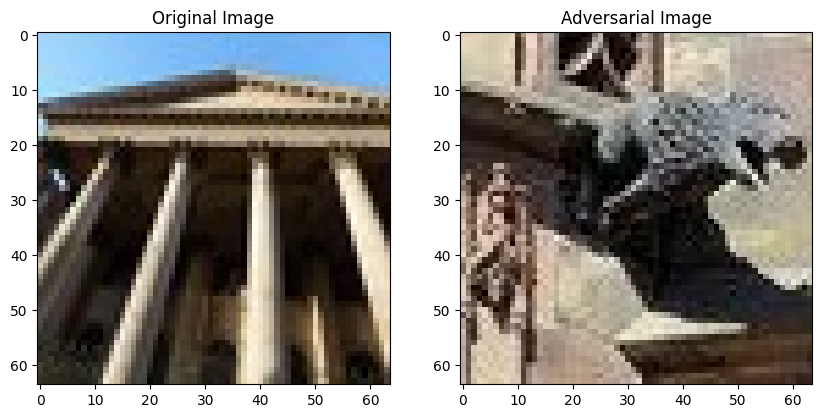

In [21]:
#implement a JPEG compression for an image
import io
import PIL.Image
import torchvision.transforms as transforms
import numpy as np
import torch
def randomJPEG(image):
    """
    Apply JPEG compression to a given image.
    img: a tensor of shape (C, H, W)
    quality: quality of the compression
    """
    quality = np.random.randint(60, 100)
    image = transforms.ToPILImage()(image)
    buffer = io.BytesIO()
    image.save(buffer, format='jpeg', quality=quality)
    buffer.seek(0)
    img = PIL.Image.open(buffer)
    img = transforms.ToTensor()(img)
    return img
image = adver['examples'][0]
result=randomJPEG(image)
ax, fig = plt.subplots(1, 2, figsize=(10, 5))
fig[0].imshow(original_image.permute(1, 2, 0))
fig[0].set_title("Original Image")
fig[1].imshow(result.permute(1, 2, 0))
fig[1].set_title("Adversarial Image")
plt.show()
# plt.imshow(result.permute(1, 2, 0))
# plt.show()

[03/02/24 16:39:30] WARNING  Clipping input data to the valid range for imshow with RGB data ([0..1]   ]8;id=72731;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py\image.py]8;;\:]8;id=614060;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py#701\701]8;;\
                             for floats or [0..255] for integers).                                                 

                    WARNING  Clipping input data to the valid range for imshow with RGB data ([0..1]   ]8;id=698820;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py\image.py]8;;\:]8;id=31297;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py#701\701]8;;\
                             for floats or [0..255] for integers).                                                 

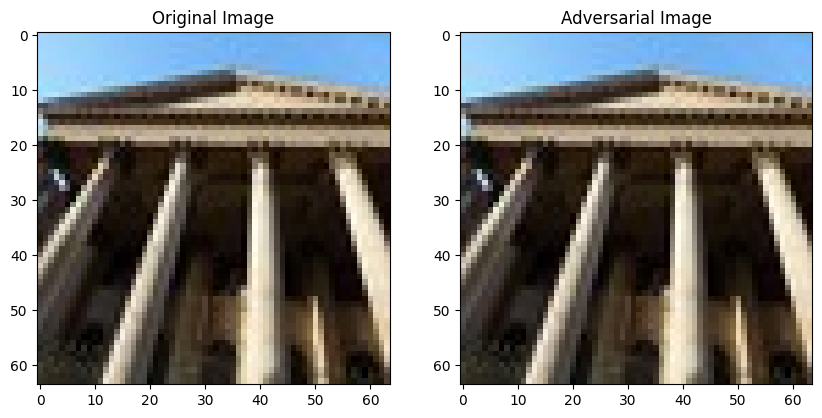

In [23]:
#impolement a webp compression for an image
import PIL.Image
import torchvision.transforms as transforms
import numpy as np
import torch
def randomWEBP(image):
    """
    Apply WEBP compression to a given image.
    img: a tensor of shape (C, H, W)
    quality: quality of the compression
    """
    quality = np.random.randint(60, 100)
    image = transforms.ToPILImage()(image)
    buffer = io.BytesIO()
    image.save(buffer, format='webp', quality=quality)
    buffer.seek(0)
    img = PIL.Image.open(buffer)
    img = transforms.ToTensor()(img)
    return img
image = adver['examples'][3]
result=randomWEBP(image)
ax, fig = plt.subplots(1, 2, figsize=(10, 5))
fig[0].imshow(original_image.permute(1, 2, 0))
fig[0].set_title("Original Image")
fig[1].imshow(image.permute(1, 2, 0))
fig[1].set_title("Adversarial Image")
plt.show()

torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])


[03/01/24 21:43:52] WARNING  Clipping input data to the valid range for imshow with RGB data ([0..1]   ]8;id=224110;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py\image.py]8;;\:]8;id=52355;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py#701\701]8;;\
                             for floats or [0..255] for integers).                                                 

                    WARNING  Clipping input data to the valid range for imshow with RGB data ([0..1]   ]8;id=56776;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py\image.py]8;;\:]8;id=986474;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py#701\701]8;;\
                             for floats or [0..255] for integers).                                                 

                    WARNING  Clipping input data to the valid range for imshow with RGB data ([0..1]   ]8;id=865135;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py\image.py]8;;\:]8;id=215200;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py#701\701]8;;\
                             for floats or [0..255] for integers).                                                 

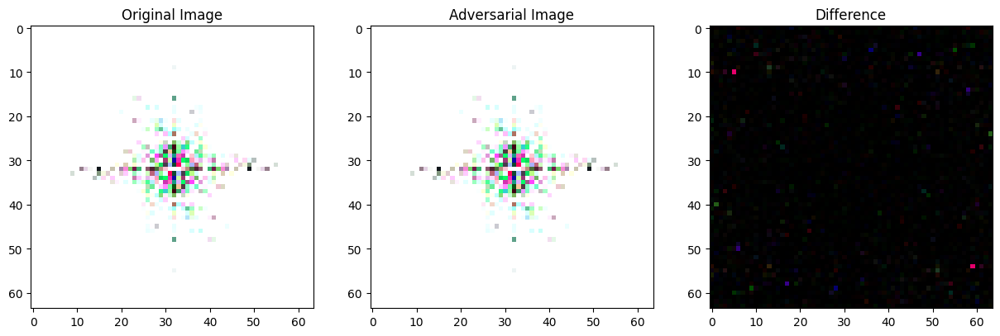

In [94]:
#implement a 2d FFT for an image using pytorch
def randomFFT(image):
    """
    Apply 2D FFT to a given image.
    img: a tensor of shape (C, H, W)
    """
    fft = torch.fft.fft2(image, norm="ortho")
    fft = torch.fft.fftshift(fft)
    print(fft.shape)
    #fft = torch.log(torch.norm(fft,dim=0) + 1e-6)
    return torch.abs(torch.log10(fft.real**2+fft.imag**2))
image = adver['examples'][1]
original_image = adver['original'][1]
result_adv=randomFFT(image)

result_original=randomFFT(original_image)
result_diff = randomFFT(np.abs(image-original_image))
Difference = result_adv - result_original
ax, fig = plt.subplots(1, 3, figsize=(15, 5))
fig[0].imshow(result_original.permute(1, 2, 0))
fig[0].set_title("Original Image")
fig[1].imshow(result_adv.permute(1, 2, 0))
fig[1].set_title("Adversarial Image")
fig[2].imshow(Difference.permute(1, 2, 0))
fig[2].set_title("Difference")
plt.show()




In [93]:
result_adv


tensor([[[2.5615, 3.9775, 2.2854,  ..., 3.0882, 2.2854, 3.9775],
         [3.6185, 2.8695, 2.4986,  ..., 2.9199, 3.2877, 2.7776],
         [2.5460, 3.2405, 2.6899,  ..., 2.8195, 3.2813, 2.6787],
         ...,
         [2.2749, 3.5513, 2.7721,  ..., 2.9622, 3.1340, 2.4909],
         [2.5460, 2.6787, 3.2813,  ..., 2.9059, 2.6899, 3.2405],
         [3.6185, 2.7776, 3.2877,  ..., 2.7951, 2.4986, 2.8695]],

        [[2.6907, 3.8546, 2.2898,  ..., 2.7888, 2.2898, 3.8546],
         [3.1347, 3.0319, 2.5747,  ..., 2.9519, 3.4160, 2.8403],
         [2.5813, 3.2576, 2.6100,  ..., 3.0336, 3.4775, 2.5840],
         ...,
         [2.3369, 3.4028, 2.9471,  ..., 2.6772, 3.0013, 2.5225],
         [2.5813, 2.5840, 3.4775,  ..., 2.9749, 2.6100, 3.2576],
         [3.1347, 2.8403, 3.4160,  ..., 3.0390, 2.5747, 3.0319]],

        [[2.5269, 3.9190, 2.3168,  ..., 2.9039, 2.3168, 3.9190],
         [3.2637, 2.8318, 2.4996,  ..., 2.9355, 3.2477, 2.7485],
         [2.5381, 3.2314, 2.6080,  ..., 2.8645, 3.3638, 2

[03/02/24 16:57:21] WARNING  Clipping input data to the valid range for imshow with RGB data ([0..1]   ]8;id=922590;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py\image.py]8;;\:]8;id=758151;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py#701\701]8;;\
                             for floats or [0..255] for integers).                                                 

                    WARNING  Clipping input data to the valid range for imshow with RGB data ([0..1]   ]8;id=502125;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py\image.py]8;;\:]8;id=215948;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py#701\701]8;;\
                             for floats or [0..255] for integers).                                                 

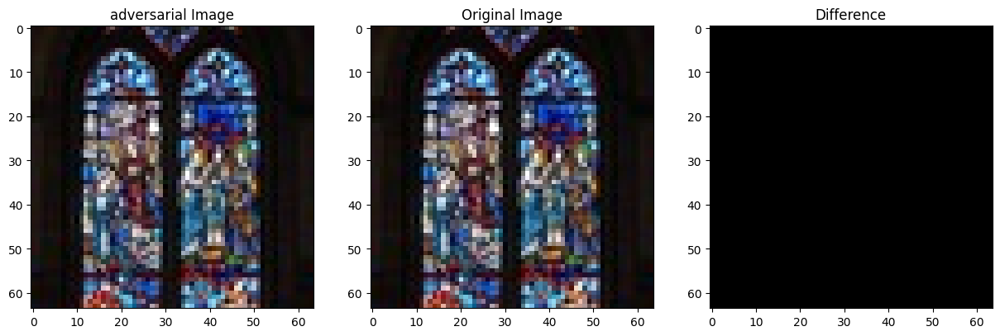

In [27]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(image.permute(1, 2, 0))
ax[0].set_title( "adversarial Image")
ax[1].imshow(original_image.permute(1, 2, 0))
ax[1].set_title("Original Image")
ax[2].imshow(20*torch.log10(np.abs(original_image-image)).permute(1, 2, 0))
ax[2].set_title("Difference")
plt.show()


tensor([10.2769, 10.4858, 11.7227])

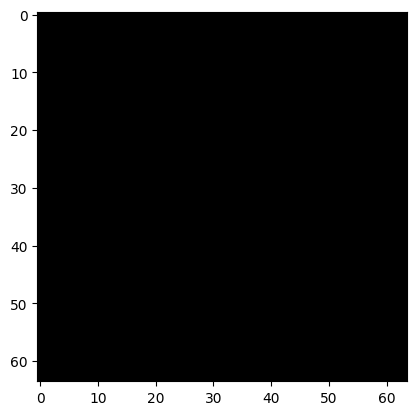

In [44]:
to_look = 9
image = adver['examples'][to_look]
original_image = adver['original'][to_look]
plt.imshow(np.abs(original_image-image).permute(1, 2, 0))

# plt.imshow(image.permute(1, 2, 0))
np.abs(original_image-image).sum(axis=(1,2))

In [39]:
np.abs(original_image-image).sum(axis=(1,2))

tensor([10.2769, 10.4857, 11.7227])

# Testing the code to generate the report

In [1]:

import matplotlib.pyplot as plt
import matplotlib.figure as matplt
import numpy as np
import torch
import torchvision
import torchvision.transforms as transforms
from typing import Tuple, Dict, List
import pandas as pd
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

import torch.optim as optim
from sklearn.metrics import confusion_matrix
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
import sys
sys.path.append('../src')
from adversarialexamples.pipelines.defenses.tranformation_defense import JPEGTransform, FlipTransform, ResizePadTransform, DistortTransform


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


        


class AdversarialDataset(Dataset):
    def __init__(self, data_dict, transform=None):
        """
        Args:
            data_dict (dict): Dictionary containing adversarial data.
            transform (callable, optional): Optional transform to be applied on the examples.
        """
        self.data_dict = data_dict
        self.transform = transform

    def __len__(self):
        return len(self.data_dict["real_labels"])

    def __getitem__(self, idx):
        sample = {key: value[idx] for key, value in self.data_dict.items()}
        if self.transform:
            sample["examples"] = self.transform(sample["examples"])
        return sample




def init_model(model:torch.nn.Module,lr:float=0.001)->Tuple[nn.Module,nn.Module,optim.Optimizer]:
    # Move model to GPU if available
    model = model.to(device)
    if device == 'cuda':
        model= torch.nn.DataParallel(model)
        cudnn.benchmark = True
    return model

def General_defense_transform(adversarial_data: Dict, transformations:List, params_data: Dict,batch_size:int = 512) -> torch.utils.data.DataLoader:
    """
    This function applies a general transformation to the adversarial examples
    """
    transform = transforms.Compose([
        *transformations,
        transforms.Normalize(mean=params_data["mean"], std=params_data["std"])
    ])
    dataset = AdversarialDataset(adversarial_data, transform=transform)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
    return loader

def KL_divergence(p,q):
    epsilon = 1e-10
    p += epsilon
    q +=epsilon

    p /= p.sum()
    q /= q.sum()

    return (p*(p/q).log()).sum().item()

def plot_confidence_distribution_single_class(data, class_name):
    g = sns.PairGrid(data, diag_sharey=False)
    g.map_upper(sns.kdeplot, levels=12, cmap="icefire")
    g.map_lower(sns.kdeplot, levels=7, cmap="icefire")
    g.map_lower(sns.scatterplot, s=10)
    g.map_diag(sns.histplot, bins=32, stat="density", element="step")
    g.figure.suptitle(f'{class_name} Distributions')
    plt.tight_layout()
    return g.figure

def plot_confidence_distribution_all(Confidences, Labels, classes):
    figs = {}  # List to store individual figures
    Distances = {}
    confidences_model = Confidences["model_confidence"]
    confidences_adversarial = Confidences["adversarial_confidence"]
    confidences_defense = Confidences["defense_confidence"]
    true_labels = Labels["true_labels"]

    for idx, class_name in enumerate(classes):
        values_model = [confidences_model[i] for i, label in enumerate(true_labels) if label == idx]
        values_adversarial = [confidences_adversarial[i] for i, label in enumerate(true_labels) if label == idx]
        values_defense = [confidences_defense[i] for i, label in enumerate(true_labels) if label == idx]

        model_hist = torch.histc(torch.Tensor(values_model),bins=32,min=0,max=1)
        adv_hist = torch.histc(torch.Tensor(values_adversarial),bins=32,min=0,max=1)
        def_hist = torch.histc(torch.Tensor(values_defense),bins=32,min=0,max=1)
        Distances[f"{class_name}_Adversarial"] = KL_divergence(adv_hist,model_hist)
        Distances[f"{class_name}_Defense"] = KL_divergence(def_hist,model_hist)
        data = pd.DataFrame({"Model": values_model, "Adversarial": values_adversarial, "Defense": values_defense})
        
        fig = plot_confidence_distribution_single_class(data, class_name)
        figs[f"{class_name}.png"] = fig
        # figs.append(fig)
    return figs, Distances



def plot_sub_confusion_matrix(fig, cm, classes, position, show_colorbar=False):
    """
    This function adds a heatmap of the confusion matrix to a subplot position.
    """
    
    hm = go.Heatmap(
        z=cm[::-1],
        x=classes,
        y=classes[::-1], 
        colorscale='blues',
        showscale=show_colorbar,
        coloraxis="coloraxis",
        hoverinfo="x+y+z",
        hovertemplate="Predicted: %{x}<br>Real: %{y}<br>Number: %{z}<extra></extra>"  # <extra></extra> hides additional hover info
    )

    fig.add_trace(hm, row=1, col=position)

    for i, row in enumerate(cm):
        for j, val in enumerate(row):
             fig.add_annotation(
                dict(
                    x=classes[j], 
                    y=classes[i], 
                    xref=f'x{position}',
                    yref=f'y{position}',
                    text=f"<b>{val}</b>",
                    showarrow=False,
                    font=dict(
                        color="gray",
                        size=12
                    )
                )
            )
    fig.update_yaxes(title_text="True label", row=1, col=position)
    fig.update_xaxes(title_text="Predicted label", row=1, col=position)

def plot_confusion_matrix(labels,classes):
    # Compute confusion matrices
    conf_matrix_defense = confusion_matrix(labels['true_labels'], labels['defense_labels'])
    conf_matrix_model = confusion_matrix(labels['true_labels'], labels['model_labels'])
    conf_matrix_adversarial = confusion_matrix(labels['true_labels'], labels['adversarial_labels'])

    fig = make_subplots(
        rows=1, cols=3,
        shared_yaxes=True,
        subplot_titles=('Model', 'Adversarial', 'Defense'),
        horizontal_spacing=0.01
    )
    plot_sub_confusion_matrix(fig, conf_matrix_model, classes, 1)
    plot_sub_confusion_matrix(fig, conf_matrix_adversarial, classes, 2)
    plot_sub_confusion_matrix(fig, conf_matrix_defense, classes, 3, show_colorbar=True)

    fig.update_layout(title=dict(text="Confusion Matrices", x=0.5, xanchor='center'), height=600, width=1500)
    return fig

def Report(dataloader:torch.utils.data.DataLoader,model:nn.Module,Report_params:Dict) -> Tuple[Dict,Dict,go.Figure,List[matplt.Figure]]:
    model_classifier = init_model(model)
    model_classifier.eval()
    correct_defense = 0
    correct_model = 0
    correct_adversarial = 0
    total = 0
    confidence_defense, confidence, confidence_adversarial = [], [], []
    true_labels, model_predictions, adversarial_predictions, defense_predictions = [], [], [], []
    model_prediction_top_k, adversarial_predictions_top_k,defense_predictions_top_k = [], [], []
    
    for batch in dataloader:
        images, real_labels = batch["examples"], batch["real_labels"]
        model_labels, adversarial_labels = batch["model_labels"], batch["adversarial_labels"]
        model_confidence, adversarial_confidence = batch ["confidence"], batch["adversarial_confidence"]

        images, real_labels = images.to(device), real_labels.to(device)
        model_labels, adversarial_labels = model_labels.to(device), adversarial_labels.to(device)
        model_confidence, adversarial_confidence = model_confidence.to(device), adversarial_confidence.to(device) 
        with torch.no_grad():
            outputs = model_classifier(images)
            _, predicted = torch.max(outputs.data, 1)
            predicted_top_k = outputs.topk(Report_params['Top_k'], dim=-1)[1].squeeze()
            confidence_defense.extend(F.softmax(outputs, dim=1).max(dim=1)[0].cpu().numpy())
            confidence.extend(model_confidence.cpu().numpy())
            confidence_adversarial.extend(adversarial_confidence.cpu().numpy())
            total += real_labels.size(0)
            correct_defense += (predicted == real_labels).sum().item()
            correct_model += (model_labels == real_labels).sum().item()
            correct_adversarial += (adversarial_labels == real_labels).sum().item()
            true_labels.extend(real_labels.cpu().numpy())
            model_predictions.extend(model_labels.cpu().numpy())
            adversarial_predictions.extend(adversarial_labels.cpu().numpy())
            defense_predictions.extend(predicted.cpu().numpy())
            

    original_accuracy = correct_model *100 /total
    adversarial_accuracy = correct_adversarial *100 /total
    defense_accuracy = correct_defense *100 /total

    Accuracies = {"Accuracy":original_accuracy,
                  "Adversarial_accuracy":adversarial_accuracy, 
                  "Defense_accuracy":defense_accuracy}
    
    Labels = {"true_labels": true_labels, 
              "model_labels": model_predictions, 
              "adversarial_labels":adversarial_predictions, 
              "defense_labels":defense_predictions}
    
    Confidences = {"model_confidence":confidence,
                   "adversarial_confidence":confidence_adversarial,
                   "defense_confidence":confidence_defense}
    
    Classes = Report_params["Classes"]
    figs, Kl_dists = plot_confidence_distribution_all(Confidences,Labels,Classes) 
    conf_matrix = plot_confusion_matrix(labels=Labels,classes=Classes)
    
    return Accuracies,Kl_dists,conf_matrix ,figs

In [3]:
attack = "DeepFool"
model_ref = "Resnet_model"
model = catalog.load(model_ref)
adver = catalog.load(f'{model_ref}_Adversarial_{attack}@Dataset')

[03/03/24 12:01:56] INFO     Loading data from Resnet_model (PytorchDatasetModel)...            ]8;id=780323;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=87031;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\

                    INFO     Loading data from Resnet_model_Adversarial_DeepFool@Dataset        ]8;id=703712;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=713859;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

In [4]:
# Define the transformations
param_data = {'mean': [0.485, 0.456, 0.406], 'std': [0.229, 0.224, 0.225]}
data_params ={'Top_k':5,'Classes':["airplane","automobile","bird","cat","deer","dog","frog","horse","ship","truck"]}

In [66]:
# make code that creates all possible combinations of transformations
import itertools

transformations = {"Flip":FlipTransform,"ResizePad":ResizePadTransform,"Distort":DistortTransform,"JPEG":JPEGTransform}
defense_result={}
# transformations = {"Flip":FlipTransform,"ResizePad":ResizePadTransform,"Distort":DistortTransform}
for i in range(1,len(transformations.keys())+1):
    for trans in list(itertools.permutations(transformations.keys(),i)):
        transformation_name = "_".join(trans)
        defense_result[transformation_name] = General_defense_transform(adver,[transformations[name]() for name in trans],param_data)
        
        # defense_result.append(transformation_name)
        #data_loader = General_defense_transform(adver,[transformations[name]() for name in trans],param_data)
        #report = Report(data_loader,model,data_params)


In [69]:
len(defense_result)*4*3

768

In [25]:
report[1]


{
    'airplane_Adversarial': 3.6462745666503906,
    'airplane_Defense': 0.014948263764381409,
    'automobile_Adversarial': 4.256932258605957,
    'automobile_Defense': 0.039934366941452026,
    'bird_Adversarial': 2.987950086593628,
    'bird_Defense': 0.050075698643922806,
    'cat_Adversarial': 2.6651058197021484,
    'cat_Defense': 0.057066410779953,
    'deer_Adversarial': 3.132697820663452,
    'deer_Defense': 0.062180712819099426,
    'dog_Adversarial': 2.7975406646728516,
    'dog_Defense': 0.07357686758041382,
    'frog_Adversarial': 3.4423813819885254,
    'frog_Defense': 0.05566929280757904,
    'horse_Adversarial': 3.274644374847412,
    'horse_Defense': 0.03196801245212555,
    'ship_Adversarial': 5.420999050140381,
    'ship_Defense': 0.10038692504167557,
    'truck_Adversarial': 3.9869577884674072,
    'truck_Defense': 0.03659945726394653
}

In [5]:
attack = "DeepFool"
model_ref = "Resnet_model"
model = catalog.load(model_ref)
adver = catalog.load(f'{model_ref}_Adversarial_{attack}@Dataset')
param_data = {'mean': [0.485, 0.456, 0.406], 'std': [0.229, 0.224, 0.225]}
data_params ={'Top_k':5,'Classes':['altar', 'apse', 'bell_tower', 'column', 'dome(inner)', 'dome(outer)', 'flying_buttress', 'gargoyle', 'stained_glass', 'vault']}
data_loader = General_defense_transform(adver,[JPEGTransform()],param_data)

[03/03/24 12:02:05] INFO     Loading data from Resnet_model (PytorchDatasetModel)...            ]8;id=633546;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=341723;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\

[03/03/24 12:02:06] INFO     Loading data from Resnet_model_Adversarial_DeepFool@Dataset        ]8;id=571570;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=62034;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

In [143]:
def generate_report_per_class(labels,classes,predictions,confidence):
    class_report = {}
    for idx, class_name in enumerate(classes):
        confidence_model = np.array([confidence[i] for i, label in enumerate(labels) if label == idx])
        positions = np.where(labels == idx)
        class_report[class_name] = {"accuracy":np.sum(labels[positions] == predictions[positions])/len(labels[positions]),
                                    "confidence_mean":confidence_model.mean(),
                                    "confidence_std":confidence_model.std(),
                                    "confidence_max":confidence_model.max(),
                                    "confidence_min":confidence_model.min(),
                                    "confidence_25":np.percentile(confidence_model,25),
                                    "confidence_75":np.percentile(confidence_model,75)}
    return class_report
    

def generate_report(data_loader,model,data_params,get_original=False):
    model_classifier = init_model(model)
    model_classifier.eval()
    accuracy = 0
    top_k_accuracy = 0
    total = 0
    confidence = []
    confidence_top_k = []
    true_labels = []
    model_predictions = []
    model_prediction_top_k = []
    for batch in data_loader:
        if get_original:
            images, real_labels = batch["original"], batch["real_labels"]
        else:
            images, real_labels = batch["examples"], batch["real_labels"]
            
        images, real_labels = images.to(device), real_labels.to(device)
        
        with torch.no_grad():
            outputs = model_classifier(images)
            prediction_top_k = F.softmax(outputs,dim=1).topk(data_params["Top_k"], dim=-1)
            _, predicted = torch.max(outputs.data, 1)
            predicted_top_k = prediction_top_k[1].squeeze()
            confidence_top_k.extend(prediction_top_k[0].cpu().numpy())
            confidence.extend(F.softmax(outputs, dim=1).max(dim=1)[0].cpu().numpy())
            total += real_labels.size(0)
            accuracy += (predicted == real_labels).sum().item()
            top_k_accuracy += (predicted_top_k == real_labels[...,None]).any(dim=-1).sum().item()
            true_labels.extend(real_labels.cpu().numpy())
            model_predictions.extend(predicted.cpu().numpy())
            model_prediction_top_k.extend(predicted_top_k.cpu().numpy())
    accuracy = accuracy * 100 / total
    top_k_accuracy = top_k_accuracy * 100 / total
    #get the report per class
    confidence = np.array(confidence)
    confidence_top_k = np.array(confidence_top_k)
    true_labels = np.array(true_labels)
    model_predictions = np.array(model_predictions)
    model_prediction_top_k = np.array(model_prediction_top_k)
    
    class_report = generate_report_per_class(true_labels,data_params["Classes_names"],model_predictions,confidence)
    
    elements_to_return = [accuracy, top_k_accuracy,
                          confidence,confidence_top_k,
                          true_labels,model_predictions,
                          class_report
                          ]
    return elements_to_return

def Generate_total_report(adversarial_data,data_params,model,transformations):
    #get the original report
    data_loader = General_defense_transform(adversarial_data,[],data_params)
    original_report = generate_report(data_loader,model,data_params,get_original=True)
    #get the adversarial report
    data_loader = General_defense_transform(adversarial_data,[],data_params)
    adversarial_report = generate_report(data_loader,model,data_params)
    #get the defense report
    data_loader = General_defense_transform(adversarial_data,transformations,data_params)
    defense_report = generate_report(data_loader,model,data_params)
    Accuracies = {"Original":original_report[0],
                    "Adversarial":adversarial_report[0],
                    "Defense":defense_report[0]}
    Top_k_Accuracies = {"Original":original_report[1],
                    "Adversarial":adversarial_report[1],
                    "Defense":defense_report[1]}
    Confidences = {"Original":original_report[2],
                    "Adversarial":adversarial_report[2],
                    "Defense":defense_report[2]}
    Confidences_top_k = {"Original":original_report[3],
                    "Adversarial":adversarial_report[3],
                    "Defense":defense_report[3]}
    Labels = {"Original":original_report[5],
              "True_labels":original_report[4],
              "Adversarial":adversarial_report[5],
              "Defense":defense_report[5]}
    Class_reports = {"Original":original_report[6],
                    "Adversarial":adversarial_report[6],
                    "Defense":defense_report[6]}
    To_Return={"Accuracies":Accuracies,
               "Top_k_Accuracies":Top_k_Accuracies,
              "Confidences":Confidences,
              "Confidences_top_k":Confidences_top_k,
              "Labels":Labels,
              "Class_reports":Class_reports}
    return To_Return
def plot_confidence_distribution_all(Confidences, Labels, classes):
    figs = {}  # List to store individual figures
    Distances = {}
    confidences_model = Confidences["Original"]
    confidences_adversarial = Confidences["Adversarial"]
    confidences_defense = Confidences["Defense"]
    true_labels = Labels["True_labels"]

    for idx, class_name in enumerate(classes):
        values_model = [confidences_model[i] for i, label in enumerate(true_labels) if label == idx]
        values_adversarial = [confidences_adversarial[i] for i, label in enumerate(true_labels) if label == idx]
        values_defense = [confidences_defense[i] for i, label in enumerate(true_labels) if label == idx]

        model_hist = torch.histc(torch.Tensor(values_model),bins=32,min=0,max=1)
        adv_hist = torch.histc(torch.Tensor(values_adversarial),bins=32,min=0,max=1)
        def_hist = torch.histc(torch.Tensor(values_defense),bins=32,min=0,max=1)
        Distances[f"{class_name}_Adversarial"] = KL_divergence(adv_hist,model_hist)
        Distances[f"{class_name}_Defense"] = KL_divergence(def_hist,model_hist)
        data = pd.DataFrame({"Model": values_model, "Adversarial": values_adversarial, "Defense": values_defense})
        
        fig = plot_confidence_distribution_single_class(data, class_name)
        figs[f"{class_name}.png"] = fig
        # figs.append(fig)
    return figs, Distances

def plot_confusion_matrix(labels,classes):
    # Compute confusion matrices
    conf_matrix_defense = confusion_matrix(labels['True_labels'], labels['Defense'])
    conf_matrix_model = confusion_matrix(labels['True_labels'], labels['Original'])
    conf_matrix_adversarial = confusion_matrix(labels['True_labels'], labels['Adversarial'])

    fig = make_subplots(
        rows=1, cols=3,
        shared_yaxes=True,
        subplot_titles=('Model', 'Adversarial', 'Defense'),
        horizontal_spacing=0.01
    )
    plot_sub_confusion_matrix(fig, conf_matrix_model, classes, 1)
    plot_sub_confusion_matrix(fig, conf_matrix_adversarial, classes, 2)
    plot_sub_confusion_matrix(fig, conf_matrix_defense, classes, 3, show_colorbar=True)

    fig.update_layout(title=dict(text="Confusion Matrices", x=0.5, xanchor='center'), height=600, width=1500)
    return fig
def run_single_defense(adversarial_data,model,transformations,data_params):
    report = Generate_total_report(adversarial_data,data_params,model,transformations)
    figs, Kl_dists = plot_confidence_distribution_all(report["Confidences"],report["Labels"],data_params["Classes_names"]) 
    conf_matrix = plot_confusion_matrix(labels=report["Labels"],classes=data_params["Classes_names"])
    return report,figs,Kl_dists,conf_matrix

def run_all_defenses(adversarial_data,model,data_params):
    reports = {}
    figs = {}
    Kl_dists = {}
    conf_matrix = {}
    transformations = {"Flip":FlipTransform,"ResizePad":ResizePadTransform,"Distort":DistortTransform,"JPEG":JPEGTransform}
    for i in range(1,len(transformations.keys())+1):
        for trans in list(itertools.permutations(transformations.keys(),i)):

            transformation_name = "_".join(trans)
            print(transformation_name)
            to_apply = [transformations[name]() for name in trans]
            reports[transformation_name]=run_single_defense(adversarial_data,
                                                            model,
                                                            to_apply,
                                                            data_params)
            figs[transformation_name] = reports[transformation_name][1]
            Kl_dists[transformation_name] = reports[transformation_name][2]
            conf_matrix[transformation_name] = reports[transformation_name][3]
        break
    return reports,figs,Kl_dists,conf_matrix 

[03/03/24 19:31:09] INFO     Loading data from Resnet_model (PytorchDatasetModel)...            ]8;id=606713;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=472266;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\

                    INFO     Loading data from Resnet_model_Adversarial_FSGM@Dataset            ]8;id=401359;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=715685;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Flip


[03/03/24 19:31:17] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=136891;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=992857;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=895407;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=381568;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=630464;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=341052;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=163242;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=345641;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=238748;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=818705;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=872965;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=946252;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:18] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=159188;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=678558;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=999159;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=385217;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=743721;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=312231;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=680232;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=707608;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=598633;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=2639;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=850121;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=618366;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=55866;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=858298;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=337847;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=570797;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=112866;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=233377;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=541876;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=907153;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=897978;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=604836;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:19] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=938394;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=168587;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=234374;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=778902;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=599783;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=733937;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=330222;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=296656;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=546985;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=49560;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=544363;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=704528;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:20] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=484737;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=771137;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=421719;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=700368;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=846939;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=978476;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=119903;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=392780;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=534384;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=5654;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=867637;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=687982;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=181224;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=812639;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=136713;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=896282;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=770918;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=423832;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:21] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=459887;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=133650;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=768141;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=920835;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=65146;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=920734;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=232274;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=724394;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=797414;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=45337;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=621889;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=206806;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=296917;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=526790;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=330072;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=957738;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=424968;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=242602;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=231266;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=175454;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:22] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=302952;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=706979;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=48696;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=123056;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=247443;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=342542;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=313085;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=150414;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=252282;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=654009;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=367247;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=152547;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=782899;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=945886;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=414141;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=102584;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=205894;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=407932;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:23] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=811667;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=9603;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=714636;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=8894;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=438434;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=258751;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=428100;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=297906;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=109809;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=275415;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=993745;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=655118;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=203295;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=330737;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=784675;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=953761;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=448574;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=248264;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=580036;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=191074;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=904024;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=409447;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:24] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=580341;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=803341;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=894907;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=814032;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=457222;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=416506;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=358383;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=677496;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=333457;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=987653;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=845157;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=521620;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=186464;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=400741;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=471428;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=29414;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:25] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=539062;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=523663;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=910614;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=901778;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=145480;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=412160;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=674039;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=210331;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=91487;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=599740;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=777155;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=103923;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=281889;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=431231;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=377266;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=362484;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=364106;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=819783;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=121098;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=78475;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=201732;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=300277;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:26] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=158284;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=173589;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=9508;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=902872;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=373745;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=310773;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=731320;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=665825;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=292343;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=187470;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=809891;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=689984;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=878123;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=966568;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=797339;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=466549;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=823283;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=430028;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:27] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=447020;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=590362;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=126709;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=611726;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=586303;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=749711;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=965278;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=44715;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=258202;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=777473;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=705023;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=954354;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=754858;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=970422;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=824618;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=668726;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=548900;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=167746;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=198479;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=981184;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:28] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=14509;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=261338;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=542094;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=297751;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=217249;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=329922;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=414179;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=5665;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=341540;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=65701;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=304054;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=859576;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=926655;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=749727;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=378019;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=215122;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=358935;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=546850;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:29] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=961836;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=114676;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=235845;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=176527;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=808244;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=929032;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=766123;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=747786;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=112728;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=524777;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=618182;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=649159;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=656966;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=868165;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=708999;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=94265;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=142565;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=647040;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=24503;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=195020;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=276563;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=949358;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:30] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=200268;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=143031;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=875386;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=418552;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=970987;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=844866;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=238885;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=978806;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=602993;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=144126;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=809865;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=216882;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=438513;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=677741;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=83438;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=127915;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:31] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=732348;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=613244;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=68624;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=593185;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=432578;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=190428;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=929454;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=652983;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=367214;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=279741;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=346472;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=147785;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=535320;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=484823;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:32] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=748293;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=910336;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=355725;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=291685;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=452090;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=945112;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=987728;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=489003;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=893389;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=862193;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=36551;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=764980;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=600788;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=142511;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=550365;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=292313;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=657682;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=963758;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=123058;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=8332;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

[03/03/24 19:31:33] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=429567;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=140201;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=281158;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=600597;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=233636;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=751050;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=500594;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=502327;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=535918;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=700685;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is                  
                             deprecated and will be removed in a future version. Convert inf values                
                             to NaN before operating instead.                                                      
                               with pd.option_context('mode.use_inf_as_na', True):                                 
                                                                                                                   

ResizePad


[03/03/24 19:31:46] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=678354;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=974726;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=982839;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=225970;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:31:47] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=824967;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=364646;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=890037;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=682147;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=562115;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=240355;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=526166;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=716536;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=697234;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=32031;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=170015;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=528020;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=956484;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=208518;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=747009;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=990258;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=1940;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=707341;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=198577;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=549928;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:31:48] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=678888;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=263933;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=901109;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=115004;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=562748;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=563326;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=737481;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=854902;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=377073;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=861898;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=34462;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=785477;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=976305;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=347066;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:31:49] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=983717;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=262510;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=288779;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=940904;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=59032;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=39064;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=890849;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=701593;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=170709;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=330368;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=676619;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=600295;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=578205;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=711711;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=987518;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=973794;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:31:50] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=24455;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=948874;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=722685;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=811531;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=176471;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=482472;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=957703;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=329878;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=422271;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=563084;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=572600;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=279018;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=772846;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=269516;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=684454;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=403202;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=730573;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=565157;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=845001;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=575774;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=318149;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=282916;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:31:51] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=373546;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=261429;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=951576;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=713763;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=229522;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=5757;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=160718;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=901026;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=576944;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=383641;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=114062;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=54660;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=674978;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=376470;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=523507;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=826409;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=241281;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=539190;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:31:52] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=481760;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=596607;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=553560;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=676918;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=590219;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=556098;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=461009;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=510010;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=345896;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=539256;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=625039;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=516530;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=250630;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=480965;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=352823;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=638322;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=357683;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=820903;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=754543;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=686330;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:31:53] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=428395;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=539178;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=223123;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=763321;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=525740;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=742228;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=427923;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=711429;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=783691;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=677511;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=425777;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=78961;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=628238;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=848656;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=821351;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=477229;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=759660;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=48628;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:31:54] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=861432;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=209984;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=747334;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=207708;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=327549;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=260418;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=391407;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=441008;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=521188;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=688556;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=131774;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=103110;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=611165;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=83798;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=925817;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=320835;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=947064;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=185932;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=837114;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=797806;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=487338;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=638145;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:31:55] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=387409;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=919613;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=122679;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=978226;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=802574;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=294633;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=408901;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=358662;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=950788;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=438548;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=187140;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=611980;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=71515;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=937137;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=55761;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=373601;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:31:56] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=75827;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=972677;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=434330;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=355839;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=562530;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=198756;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=506633;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=427239;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=900209;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=75981;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=330784;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=706551;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=87408;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=997060;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=612654;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=10663;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=100520;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=966816;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=408632;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=965403;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=381858;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=400984;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:31:57] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=759945;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=371138;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=895126;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=225903;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=338656;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=132586;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=371754;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=181069;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=618481;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=79885;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=350577;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=812958;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=77544;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=711349;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=830496;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=232583;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=247648;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=554036;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:31:58] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=448962;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=969948;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=865049;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=78900;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=605737;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=957654;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=436015;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=676852;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=618899;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=156454;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=567431;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=799321;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=289662;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=892615;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=437797;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=884743;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=733942;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=754306;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=68345;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=510855;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:31:59] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=396753;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=6890;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=332498;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=187851;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=30291;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=316783;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=726066;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=351229;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=13881;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=128807;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=132114;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=188656;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=716307;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=963923;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=422777;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=236718;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=100606;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=325334;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:32:00] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=801809;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=165728;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=453807;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=159180;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=89371;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=47665;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=983707;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=254707;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=492981;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=37389;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=173377;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=361871;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=918059;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=971977;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=599177;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=276619;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:32:01] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=833642;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=89131;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=61308;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=131114;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=412655;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=723858;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=428388;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=178501;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=490553;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=945741;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=764060;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=256100;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=407813;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=524617;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=746866;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=339043;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=911811;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=669156;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=271039;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=862629;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=288830;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=889163;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:32:02] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=104682;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=136484;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=8768;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=655046;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=209641;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=465950;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=555385;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=981076;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=10514;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=688538;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=869242;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=70285;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=737609;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=441264;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

Distort


[03/03/24 19:33:30] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=703526;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=660173;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/axisgrid.py:1274: RuntimeWarning:                                         
                                                                                                                   
                             More than 20 figures have been opened. Figures created through the                    
                             pyplot interface (`matplotlib.pyplot.figure`) are retained until                      
                             explicitly closed and may consume too much memory. (To control this                   
                             warning, see the rcParam `figure.max_open_warning`). Consider using                   
                             `matplotlib.pyplot.close()`.                                                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=9489;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=765111;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=64380;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=591015;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=604407;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=694257;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=246011;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=170239;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:31] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=338178;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=319187;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=915243;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=143573;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=914841;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=497567;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=845213;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=212641;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=705007;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=213450;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=231147;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=88180;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=998237;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=660918;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=210259;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=551478;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:32] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=748726;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=745106;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=687815;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=890067;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=394602;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=705270;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=625944;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=469259;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=407543;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=415512;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=266388;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=617389;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=822305;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=544567;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=263901;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=576645;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=527737;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=438216;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=978625;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=877199;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=426159;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=349942;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:33] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=270009;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=685869;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=356972;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=354012;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=374695;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=706837;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=81932;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=120627;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=409974;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=632605;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=30473;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=519853;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=229356;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=839346;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=642946;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=684050;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=541822;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=515332;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:34] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=673593;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=131847;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=411949;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=941443;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=455665;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=281587;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=910386;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=229613;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=27006;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=98620;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=386765;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=988677;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=809744;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=742548;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=734350;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=223519;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=570903;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=892862;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:35] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=591630;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=844687;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=764774;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=304893;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=796146;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=720555;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=828282;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=507571;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=818503;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=203760;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=16063;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=968092;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=83869;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=455909;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=789039;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=534283;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=902476;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=945324;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=647107;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=385337;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:36] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=719405;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=593498;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=26380;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=390835;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=46222;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=590446;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=745225;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=697415;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=617367;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=138521;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=124041;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=255979;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=445883;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=303367;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=535145;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=894480;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=534032;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=922286;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:37] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=79782;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=314419;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=547716;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=916511;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=160967;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=467926;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=952054;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=661491;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=647405;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=61551;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=931543;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=245705;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=611753;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=28552;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=14314;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=103723;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=869582;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=741173;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=396987;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=110495;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:38] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=925432;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=339662;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=675555;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=663221;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=597191;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=53952;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=573699;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=357836;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=809460;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=578006;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:39] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=100097;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=802486;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=981981;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=962359;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=765175;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=259879;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=486798;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=312706;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=587339;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=655126;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=800028;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=44622;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=429564;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=36864;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=7867;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=814960;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=943880;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=879953;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=476353;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=543070;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:40] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=554311;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=52521;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=540256;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=758891;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=34381;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=245872;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=980;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=71015;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=628434;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=634086;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=337140;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=43241;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=698422;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=70891;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=660934;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=778937;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=819810;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=625858;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:41] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=224157;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=686008;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=354864;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=277029;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=26137;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=822011;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=337019;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=944869;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=764026;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=900375;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=344881;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=594773;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=606148;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=548778;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=677235;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=238414;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:42] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=519344;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=206491;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=912719;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=113262;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=482277;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=914272;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=775780;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=495893;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=720826;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=251331;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=339126;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=407408;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=116054;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=170758;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=374197;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=870027;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=299788;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=954403;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=239878;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=320870;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=983975;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=484962;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:43] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=118404;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=759846;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=796316;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=683672;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=660739;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=212224;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=503920;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=750566;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=771649;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=44659;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=597416;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=315631;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=418310;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=189911;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=31115;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=565076;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=669074;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=783440;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:44] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=287558;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=654037;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=949505;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=499057;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=488035;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=893003;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=310290;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=954116;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=894999;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=556005;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=377651;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=783243;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=606207;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=93110;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=913171;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=652253;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=930703;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=101508;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=252;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=741681;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:45] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=618347;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=356612;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=194687;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=197223;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=217226;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=413808;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=342188;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=807765;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=341181;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=409309;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=765366;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=899291;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=794108;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=499271;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=152435;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=282986;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=565997;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=842071;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:33:46] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=35575;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=489001;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=638873;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=347939;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=672042;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=242812;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=398947;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=254317;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=912283;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=154257;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=96689;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=919326;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=452642;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=451966;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=63788;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=318572;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=112723;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=344883;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

JPEG


[03/03/24 19:34:00] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=732665;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=421605;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=534482;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=725319;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:01] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=646574;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=919654;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=260860;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=397756;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=70655;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=285878;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=894499;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=23346;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=74508;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=650907;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=8836;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=303316;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=209417;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=527271;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=709372;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=400187;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=390997;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=488819;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=111244;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=441072;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:02] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=559231;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=507997;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=95376;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=322615;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=855433;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=825947;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=235302;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=523760;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=759718;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=49942;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=641473;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=897551;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=638663;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=418551;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=47876;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=990791;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=42950;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=587598;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:03] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=547507;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=400889;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=452314;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=79501;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=457590;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=317845;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=249245;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=766236;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=348187;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=753302;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=550268;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=708248;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:04] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=873814;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=39698;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=943068;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=703432;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=961264;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=646664;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=37683;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=791383;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=108688;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=351608;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=499192;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=285559;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=134308;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=639676;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=479735;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=991417;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=686541;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=856017;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:05] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=716157;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=287384;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=717513;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=526328;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=867165;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=355754;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=367808;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=145140;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=980873;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=669817;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=759726;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=280155;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=27260;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=640736;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=118624;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=187725;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=316384;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=573606;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:06] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=748405;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=307056;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=427385;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=473039;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=44494;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=475222;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=745283;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=280296;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=832839;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=978271;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=778560;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=247272;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=689353;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=842248;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=712329;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=700273;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=659547;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=537440;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=801714;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=706962;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:07] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=863403;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=241903;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=307513;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=887270;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=363224;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=430397;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=412019;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=252111;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=492828;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=890513;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=680408;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=559769;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=100121;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=771652;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=73737;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=519719;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=436226;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=509216;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:08] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=784951;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=639567;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=37515;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=374727;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=526370;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=284262;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=693854;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=442050;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=209774;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=915957;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=870377;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=736139;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=464673;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=421704;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=422448;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=824174;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=944442;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=596465;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=59299;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=218618;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=282979;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=699643;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:09] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=5109;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=53683;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=25449;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=635287;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=902790;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=924558;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=618672;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=213558;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=930715;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=484331;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=469246;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=606126;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=796885;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=597908;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=953035;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=623080;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:10] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=3211;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=857919;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=768081;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=401560;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=803340;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=744453;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=491192;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=848656;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=356280;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=984264;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=622237;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=544866;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=752360;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=713429;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=747354;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=323826;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=718975;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=90154;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:11] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=34969;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=421125;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=725240;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=291240;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=662774;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=321763;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=417102;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=196307;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=557669;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=836067;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=765224;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=184787;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=359015;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=605526;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=32369;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=456076;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=988215;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=650958;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=211697;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=51176;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:12] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=552458;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=903096;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=333851;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=911611;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=398633;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=767169;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=112710;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=609691;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=376584;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=307009;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=572544;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=67642;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=638644;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=472841;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=542505;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=282924;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=965033;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=631657;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:13] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=70743;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=618251;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=667517;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=720384;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=136909;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=498924;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=332626;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=517199;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=676262;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=255048;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=203146;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=646833;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=642807;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=548809;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=153576;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=463516;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=741044;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=183237;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:14] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=394006;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=893756;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=97249;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=753130;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=388028;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=125251;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=779332;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=993895;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=677421;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=523193;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=646140;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=357238;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=487818;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=843488;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=941760;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=51178;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:15] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=225873;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=599;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=338681;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=681929;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=163771;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=830486;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=440926;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=598604;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=453157;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=886412;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=129844;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=712039;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=640404;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=315153;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=320761;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=328580;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=771514;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=253782;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=431238;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=79171;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:16] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=792870;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=975372;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=433460;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=716889;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=985033;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=552004;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=95662;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=189060;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=390857;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=435122;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=190560;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=122452;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=62085;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=258508;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=473225;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=367185;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=444907;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=111820;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

[03/03/24 19:34:17] WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=561254;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=137942;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=842959;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=108201;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

                    WARNING  /home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packa ]8;id=648415;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=160209;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/warnings.py#109\109]8;;\
                             ges/seaborn/_oldcore.py:1119: FutureWarning:                                          
                                                                                                                   
                             use_inf_as_na option is deprecated and will be removed in a future                    
                             version. Convert inf values to NaN before operating instead.                          
                                                                                                                   
                                                                                                                   

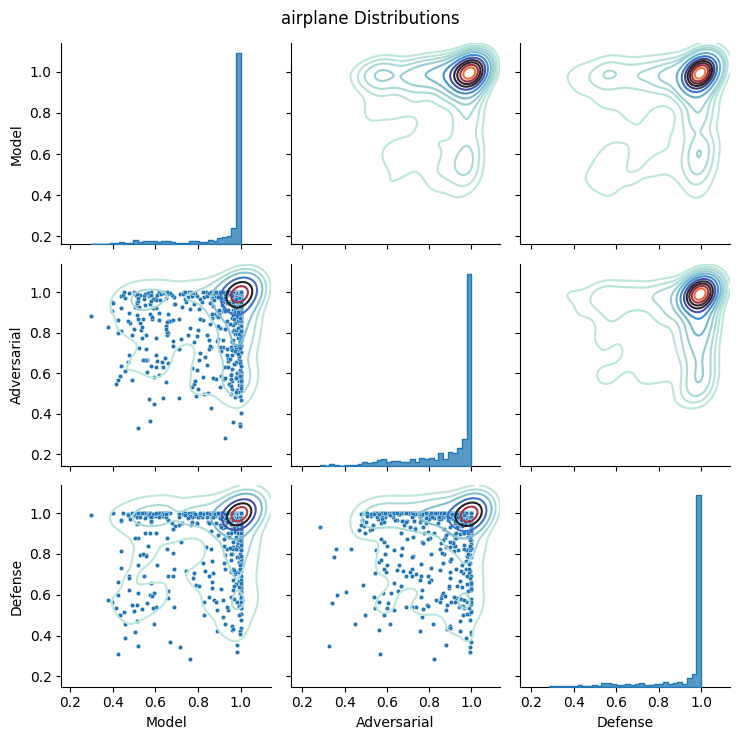

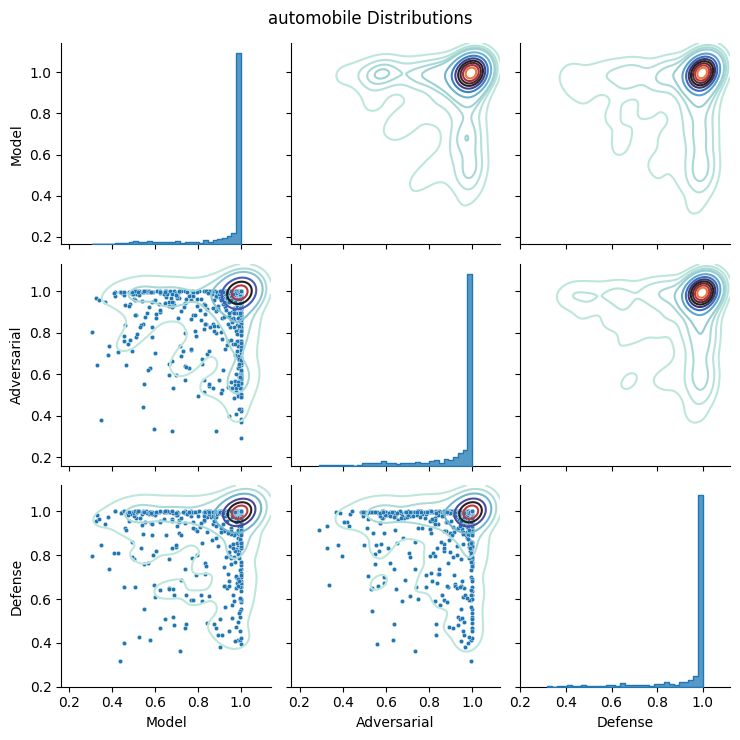

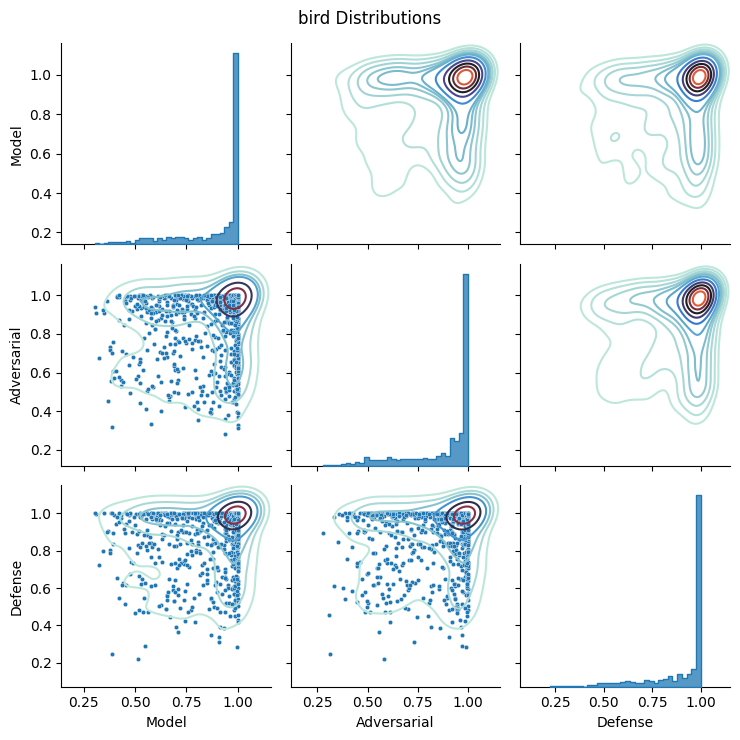

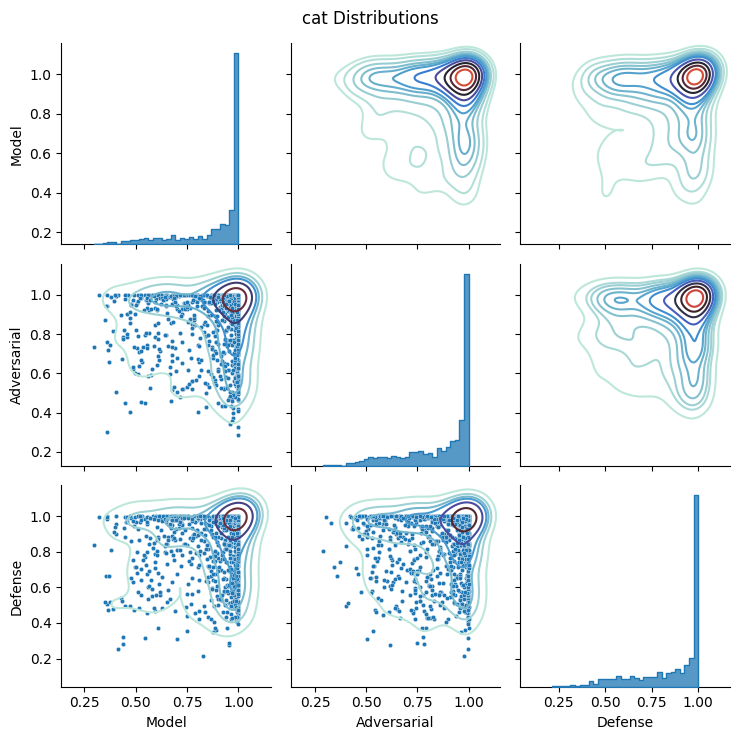

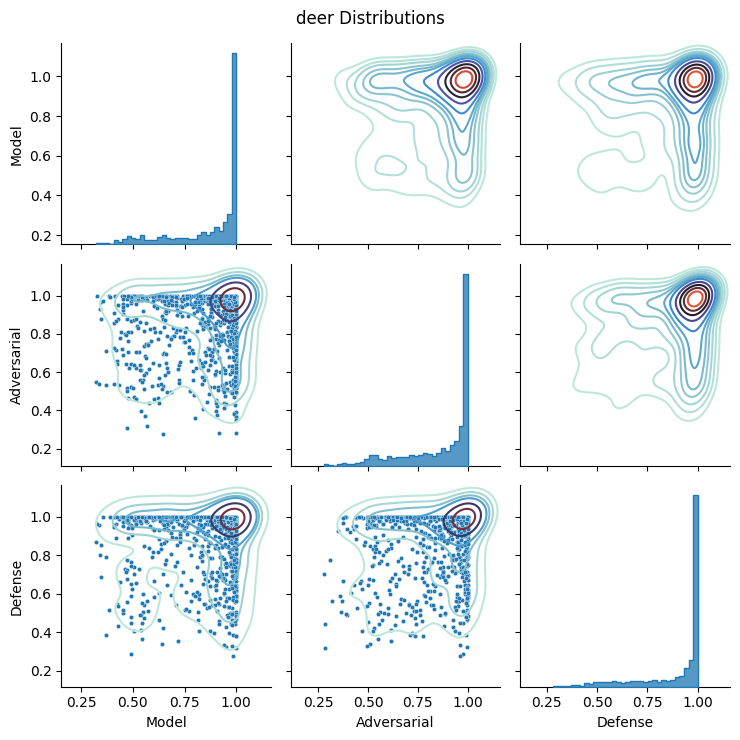

...

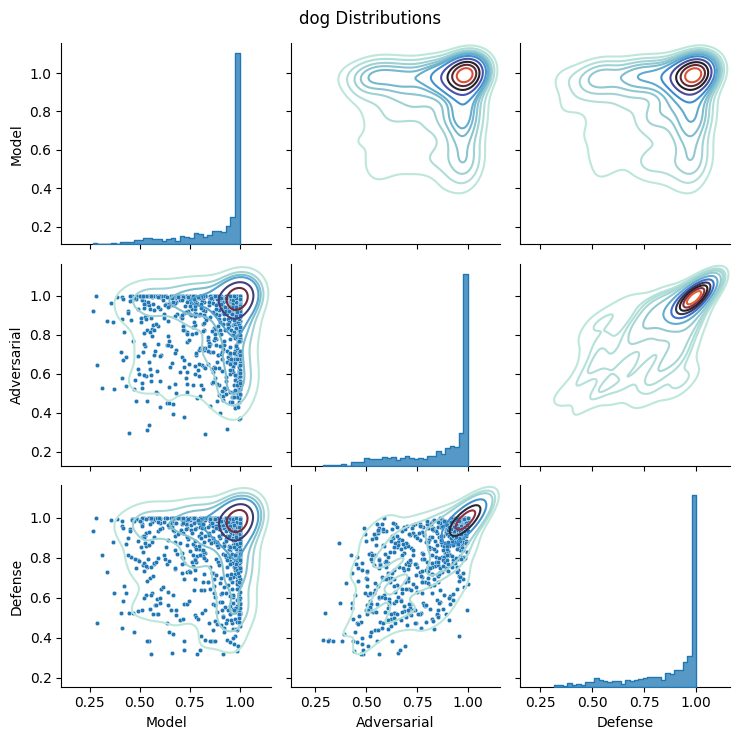

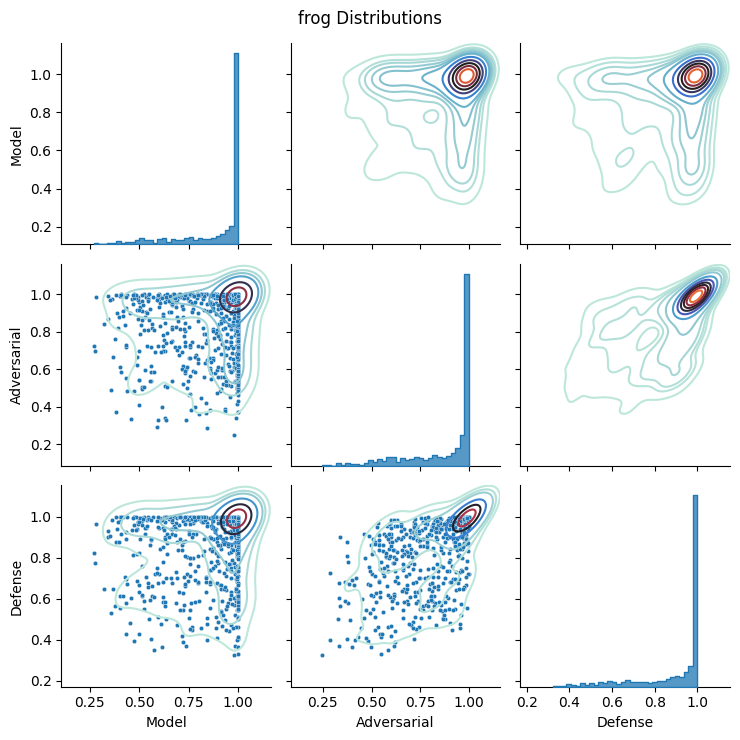

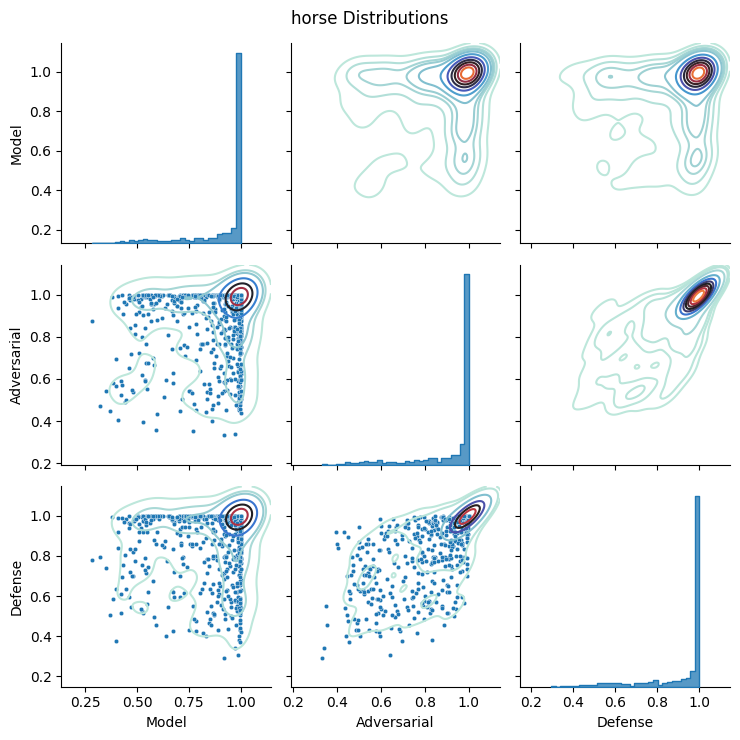

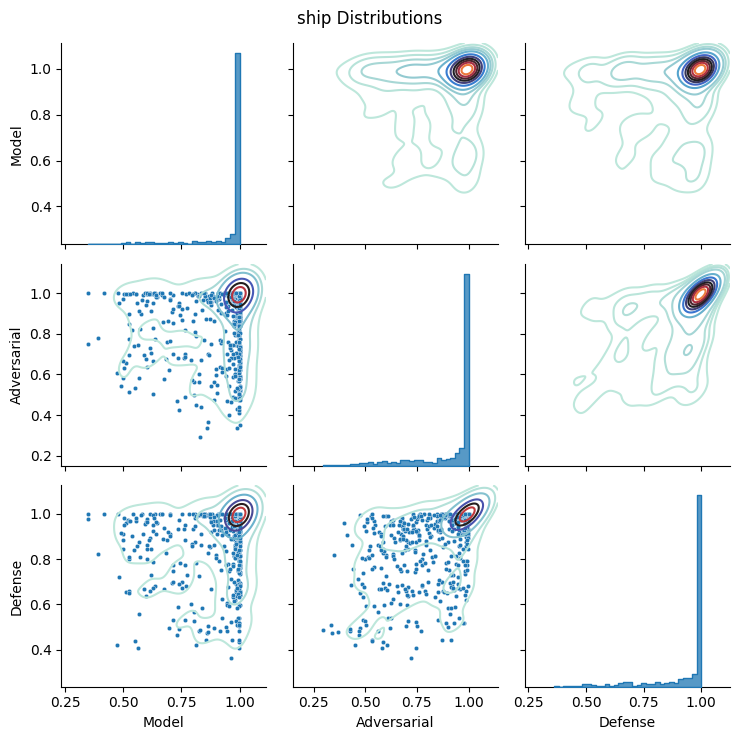

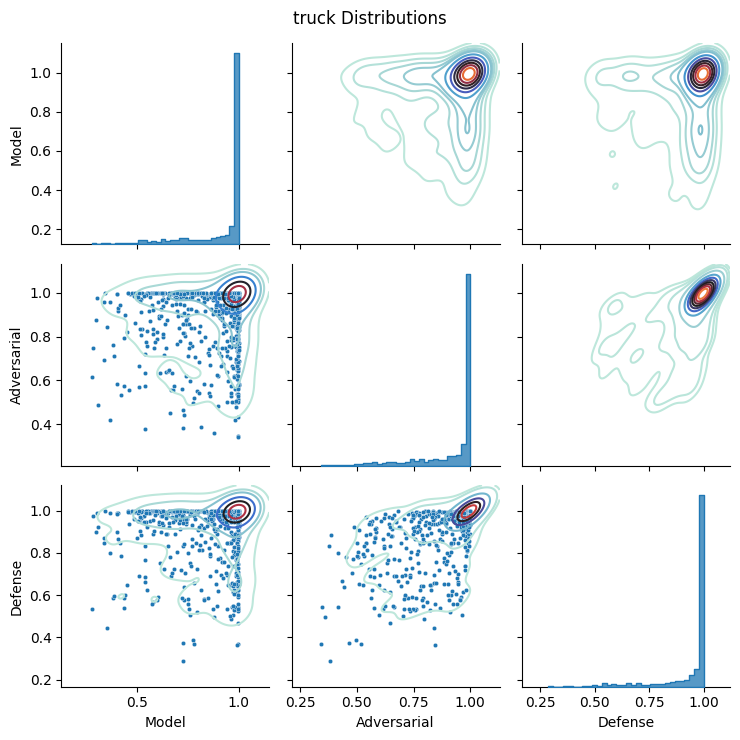

In [144]:
attack = "FSGM"
model_ref = "Resnet_model"
model = catalog.load(model_ref)
adver = catalog.load(f'{model_ref}_Adversarial_{attack}@Dataset')

data_params ={'mean': [0.4914, 0.4822, 0.4465], 'std': [0.2470, 0.2435, 0.2616],'Top_k':3,'Classes_names':["airplane","automobile","bird","cat","deer","dog","frog","horse","ship","truck"]}
x=run_all_defenses(adver,model,data_params)

In [147]:
x[0].keys()

dict_keys(['Flip', 'ResizePad', 'Distort', 'JPEG'])

In [127]:
attack = "FSGM"
model_ref = "Resnet_model"
model = catalog.load(model_ref)
adver = catalog.load(f'{model_ref}_Adversarial_{attack}@Dataset')

param_data = {'mean': [0.4914, 0.4822, 0.4465], 'std': [0.2470, 0.2435, 0.2616]}
data_params ={'Top_k':2,'Classes_names':["airplane","automobile","bird","cat","deer","dog","frog","horse","ship","truck"]}
result=Generate_total_report(adver,param_data,data_params,model,[JPEGTransform()])
figs, Kl_dists = plot_confidence_distribution_all(result["Confidences"],result["Labels"],data_params["Classes_names"])
conf_matrix = plot_confusion_matrix(labels=result["Labels"],classes=data_params["Classes_names"])

[03/03/24 18:43:32] INFO     Loading data from Resnet_model (PytorchDatasetModel)...            ]8;id=915486;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=388024;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\

                    INFO     Loading data from Resnet_model_Adversarial_FSGM@Dataset            ]8;id=907515;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=883664;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

In [105]:

data_loader = General_defense_transform(adver,[],param_data)# result of original
original_report = generate_report(data_loader,model,data_params,get_original=True)
data_loader = General_defense_transform(adver,[],param_data)# result of adversarial
adversarial_report = generate_report(data_loader,model,data_params)

data_loader = General_defense_transform(adver,[JPEGTransform()],param_data)
defense_report = generate_report(data_loader,model,data_params)# Defense report

In [107]:

original_report[0],adversarial_report[0],defense_report[0]

(73.01, 10.55, 69.41)

In [112]:
for class_name in data_params["Classes"]:

    print(f"{original_report[6][class_name]['accuracy']:.2f}  {adversarial_report[6][class_name]['accuracy']:.2f} & {defense_report[6][class_name]['accuracy']:.2f} ")

0.79  0.08 & 0.76 
0.80  0.09 & 0.70 
0.66  0.14 & 0.62 
0.66  0.19 & 0.53 
0.65  0.12 & 0.67 
0.64  0.17 & 0.58 
0.73  0.07 & 0.75 
0.75  0.08 & 0.75 
0.89  0.06 & 0.79 
0.74  0.07 & 0.79 


In [109]:
adv_report[6]


{
    'airplane': {
        'accuracy': 0.821,
        'confidence_mean': 0.76602757,
        'confidence_std': 0.15426764,
        'confidence_max': 0.9997235,
        'confidence_min': 0.24701755,
        'confidence_25': 0.6493821293115616,
        'confidence_75': 0.9000827372074127
    },
    'automobile': {
        'accuracy': 0.682,
        'confidence_mean': 0.71147317,
        'confidence_std': 0.14440204,
        'confidence_max': 0.9984079,
        'confidence_min': 0.3203071,
        'confidence_25': 0.5903743356466293,
        'confidence_75': 0.8223318308591843
    },
    'bird': {
        'accuracy': 0.535,
        'confidence_mean': 0.68652546,
        'confidence_std': 0.15136819,
        'confidence_max': 0.9978383,
        'confidence_min': 0.24617164,
        'confidence_25': 0.5661496222019196,
        'confidence_75': 0.804997444152832
    },
    'cat': {
        'accuracy': 0.465,
        'confidence_mean': 0.6817761,
        'confidence_std': 0.16278069,
      

In [110]:
defense_report[6]


{
    'airplane': {
        'accuracy': 0.758,
        'confidence_mean': 0.805566,
        'confidence_std': 0.16318727,
        'confidence_max': 1.0,
        'confidence_min': 0.33542722,
        'confidence_25': 0.6808371096849442,
        'confidence_75': 0.9490563869476318
    },
    'automobile': {
        'accuracy': 0.701,
        'confidence_mean': 0.78296185,
        'confidence_std': 0.16752069,
        'confidence_max': 0.99999917,
        'confidence_min': 0.25706357,
        'confidence_25': 0.648504912853241,
        'confidence_75': 0.9387199580669403
    },
    'bird': {
        'accuracy': 0.621,
        'confidence_mean': 0.7568584,
        'confidence_std': 0.16265453,
        'confidence_max': 0.99999964,
        'confidence_min': 0.275303,
        'confidence_25': 0.6289276778697968,
        'confidence_75': 0.8958625793457031
    },
    'cat': {
        'accuracy': 0.528,
        'confidence_mean': 0.7164831,
        'confidence_std': 0.16076295,
        'confi

In [93]:
x[-1]


{
    'airplane': {
        'accuracy': 0.821,
        'confidence_mean': 0.76602757,
        'confidence_std': 0.15426764,
        'confidence_max': 0.9997235,
        'confidence_min': 0.24701755,
        'confidence_25': 0.6493821293115616,
        'confidence_75': 0.9000827372074127
    },
    'automobile': {
        'accuracy': 0.682,
        'confidence_mean': 0.71147317,
        'confidence_std': 0.14440204,
        'confidence_max': 0.9984079,
        'confidence_min': 0.3203071,
        'confidence_25': 0.5903743356466293,
        'confidence_75': 0.8223318308591843
    },
    'bird': {
        'accuracy': 0.535,
        'confidence_mean': 0.68652546,
        'confidence_std': 0.15136819,
        'confidence_max': 0.9978383,
        'confidence_min': 0.24617164,
        'confidence_25': 0.5661496222019196,
        'confidence_75': 0.804997444152832
    },
    'cat': {
        'accuracy': 0.465,
        'confidence_mean': 0.6817761,
        'confidence_std': 0.16278069,
      

torch.Size([272, 3])

In [148]:
for index, model_ref in enumerate(["Resnet_model","Regnet_x_model","Regnet_y_model"]):
    for attack_type in ["DeepFool","CarliniL2","PGD","FSGM"]:
        print(f"{model_ref}_Adversarial_{attack_type}@Dataset")

Resnet_model_Adversarial_DeepFool@Dataset
Resnet_model_Adversarial_CarliniL2@Dataset
Resnet_model_Adversarial_PGD@Dataset
Resnet_model_Adversarial_FSGM@Dataset
Regnet_x_model_Adversarial_DeepFool@Dataset
Regnet_x_model_Adversarial_CarliniL2@Dataset
Regnet_x_model_Adversarial_PGD@Dataset
Regnet_x_model_Adversarial_FSGM@Dataset
Regnet_y_model_Adversarial_DeepFool@Dataset
Regnet_y_model_Adversarial_CarliniL2@Dataset
Regnet_y_model_Adversarial_PGD@Dataset
Regnet_y_model_Adversarial_FSGM@Dataset
